# Infrastructure exposure: the Shannon callows

A worked example with the [`euroflood`](https://github.com/cisgroup/euroflood) package,
reproducing Section S1.3 (Fig. S3) of the EuroFlood paper. It joins a decade of observed flood
footprints to a user-supplied road and settlement network, turning the archive into an
**observation-based infrastructure screen**: instead of a yes/no modelled hazard flag, every
road segment and settlement gets a *recurrence* count, how often it was actually seen flooded.

## The place

The **Shannon callows** are the broad riverine floodplain meadows along the middle River Shannon
in the Irish midlands. They flood extensively and persistently in most winters. Because the
flooding is broad and long-lived, Sentinel-1 observes it comparatively well, which makes the
reach an ideal test of an observation-based alternative to modelled hazard screening. This is
explicitly a **screening**, not a routing or accessibility model: no road is claimed severed and
no settlement isolated.

## The archive and the index

The observations come from the **CEMS-EFAS satellite-derived flood-depth maps** served through
`euroflood`'s **inverted raster index**: each approximately 90 m cell stores the identifiers of
every event that inundated it, so footprints and recurrence come from a windowed read with no
rasters downloaded. Because a `FloodFrame` is a `geopandas.GeoDataFrame`, its footprints combine
directly with an external road and settlement network through ordinary spatial operations.

> Runs against `euroflood >= 0.2.0` with the `viz` extra, querying the published index
> (needs network on first use, or a locally mirrored index).

In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Markdown

import euroflood as ef

import _support as S

IRISH_TM = "EPSG:2157"  # Irish Transverse Mercator, a metric CRS for lengths and areas

## 1. Discover

One query over the callows window returns every archived event. Index-only, no download.

In [2]:
cat = ef.floods(bbox=(-8.6, 52.7, -7.9, 53.5))
print(f"{len(cat)} events, {str(cat['date'].min())[:10]} to {str(cat['date'].max())[:10]}")
cat.head()

54 events, 2015-02-23 to 2024-11-18


,collection,event_id,date,year,end_date,cluster_id,filename,download_url,area_km2,geometry
0,historic,3064702723,2015-12-28,2016,2016-01-25,294,WD_MERGE_2015-12-28---2016-01-25_duration_28_d...,https://jeodpp.jrc.ec.europa.eu/ftp/jrc-openda...,141.313,"POLYGON ((-7.9 52.7, -7.9 53.5, -8.6 53.5, -8...."
1,historic,117792470,2016-12-26,2016,2017-01-02,288,WD_MERGE_2016-12-26---2017-01-02_duration_7_da...,https://jeodpp.jrc.ec.europa.eu/ftp/jrc-openda...,1.467,"POLYGON ((-7.9 52.7, -7.9 53.5, -8.6 53.5, -8...."
2,historic,4049036842,2019-03-04,2019,2019-04-08,333,WD_MERGE_2019-03-04---2019-04-08_duration_28_d...,https://jeodpp.jrc.ec.europa.eu/ftp/jrc-openda...,88.898,"POLYGON ((-7.9 52.7, -7.9 53.5, -8.6 53.5, -8...."
3,historic,3040053496,2016-05-02,2016,2016-05-09,090,WD_MERGE_2016-05-02---2016-05-09_duration_7_da...,https://jeodpp.jrc.ec.europa.eu/ftp/jrc-openda...,0.274,"POLYGON ((-7.9 52.7, -7.9 53.5, -8.6 53.5, -8...."
4,historic,956982064,2020-11-09,2020,2021-01-04,393,WD_MERGE_2020-11-09---2021-01-04_duration_56_d...,https://jeodpp.jrc.ec.europa.eu/ftp/jrc-openda...,46.865,"POLYGON ((-7.9 52.7, -7.9 53.5, -8.6 53.5, -8...."


## 2. Recurrence and the ever-flooded footprint

`cat.explore(footprints=True)` draws each archived event's footprint on an interactive grey
basemap. Pan and zoom to inspect the reach. Per-cell recurrence (how often each cell
flooded) is quantified just below, and we union the 54 event footprints into a single
**ever-flooded** mask, the ground seen wet at least once.

In [3]:
cat.explore(footprints=True, tiles="grayscale")

In [4]:
from euroflood.viz._raster import recurrence_grid  # noqa: E402

counts = recurrence_grid(cat)[0]
footprints = cat.footprints().to_crs(IRISH_TM)
ever_flooded = footprints.geometry.union_all()
print(f"up to {int(counts.max())} events in a single cell "
      f"· {int((counts > 0).sum()):,} cells flooded at least once")
print(f"ever-flooded footprint (union of all events): {ever_flooded.area / 1e6:.1f} km2")

up to 48 events in a single cell · 42,961 cells flooded at least once
ever-flooded footprint (union of all events): 221.6 km2


## 3. A user-supplied road and settlement network

The infrastructure comes from OpenStreetMap (roads and settlement points), committed with the
paper so the screen is reproducible. This is external, user-supplied data: OpenStreetMap
contributors, ODbL. We reproject it to Irish Transverse Mercator for metric lengths and
distances.

In [5]:
network = S.DATA / "cache" / "shannon" / "shannon_network.gpkg"
roads = gpd.read_file(network, layer="roads").to_crs(IRISH_TM)
places = gpd.read_file(network, layer="places").to_crs(IRISH_TM)
print(f"{len(roads):,} road segments · {len(places)} settlements")

4,602 road segments · 64 settlements


## 4. Exposed roads

We intersect every road with the ever-flooded footprint and sum the flooded length by road
class. The join is a single spatial operation on the euroflood footprints.

In [6]:
roads["cut_km"] = roads.geometry.intersection(ever_flooded).length / 1000
exposed = roads[roads["cut_km"] > 0]
by_class = exposed.groupby("hw")["cut_km"].sum().sort_values(ascending=False).round(2)
print(f"total mapped road length within the ever-flooded footprint: {exposed['cut_km'].sum():.1f} km")
by_class.to_frame("flooded_km")

total mapped road length within the ever-flooded footprint: 24.1 km


,flooded_km
hw,
tertiary,10.00
secondary,9.31
primary,2.07
motorway,1.92
trunk,0.79


The exposure is concentrated on the minor rural network (tertiary and secondary roads). It is
also dominated by a single wet day: the paper reports that the 23 November 2015 event alone
accounts for 16.6 km of the 24.1 km total, whereas a typical event contributes only about
1.3 km.

## 5. Recurrence, applied to the network

The archive's real advantage over a single modelled scenario is that it counts *how often* each
place floods. One pass over the 54 event footprints gives every road and settlement a flood
count, from which we read the flooded road length as a function of the required recurrence.

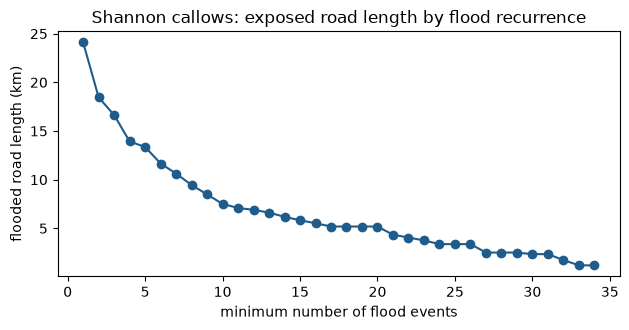

In [7]:
road_floods = np.zeros(len(roads), dtype=int)
place_floods = np.zeros(len(places), dtype=int)
road_index = roads.sindex
for geom in footprints.geometry:
    road_floods[list(road_index.query(geom, predicate="intersects"))] += 1
    place_floods[places.geometry.distance(geom).to_numpy() <= 1000] += 1
roads["n_floods"] = road_floods
places["n_floods"] = place_floods

thresholds = list(range(1, int(road_floods.max()) + 1))
cut_by_threshold = [roads.loc[roads["n_floods"] >= t, "cut_km"].sum() for t in thresholds]

fig, ax = plt.subplots(figsize=(6.4, 3.4))
ax.plot(thresholds, cut_by_threshold, "o-", color="#1f5c8b")
ax.set_xlabel("minimum number of flood events")
ax.set_ylabel("flooded road length (km)")
ax.set_title("Shannon callows: exposed road length by flood recurrence")
plt.tight_layout()
plt.show()

## 6. Settlements screened by proximity

Applying a 1 km proximity heuristic per event, we count how many settlements had detected
floodwater within 1 km, and how often.

In [8]:
within_1km = int((place_floods >= 1).sum())
chronic = int((place_floods >= 10).sum())
top = places.sort_values("n_floods", ascending=False).head(5)
print(f"{within_1km} of {len(places)} settlements within 1 km of floodwater in at least one event")
print(f"{chronic} settlements met the 1 km criterion in 10 or more events")
top[["name", "n_floods"]].reset_index(drop=True)

30 of 64 settlements within 1 km of floodwater in at least one event
13 settlements met the 1 km criterion in 10 or more events


,name,n_floods
0,Shannon Harbour,44
1,Athlone,43
2,Shannonbridge,43
3,Banagher,40
4,Ballyforan,37


In [9]:
# Key figures, computed from the cells above.
Markdown(
    f"### Key figures\n"
    f"| | |\n|---|---|\n"
    f"| **Archived events (2015 to 2024)** | **{len(cat)}** |\n"
    f"| **Ever-flooded footprint** | **{ever_flooded.area / 1e6:.0f} km²** |\n"
    f"| **Max detections in one cell** | **{int(counts.max())}** |\n"
    f"| **Flooded road length** | **{exposed['cut_km'].sum():.1f} km** |\n"
    f"| **Most repeatedly reached road** | **{int(road_floods.max())} of {len(cat)} events** |\n"
    f"| **Settlements within 1 km (>=1 / >=10 events)** | **{within_1km} / {chronic}** of {len(places)} |\n"
)

### Key figures
| | |
|---|---|
| **Archived events (2015 to 2024)** | **54** |
| **Ever-flooded footprint** | **222 km²** |
| **Max detections in one cell** | **48** |
| **Flooded road length** | **24.1 km** |
| **Most repeatedly reached road** | **34 of 54 events** |
| **Settlements within 1 km (>=1 / >=10 events)** | **30 / 13** of 64 |


## The published figure

The paper's Fig. S3 (per-cell recurrence with the road network and repeatedly reached
locations, a native-resolution detail at the Banagher reach, and the exposed-length summary) is
assembled by the paper's figure script, shown here for comparison.

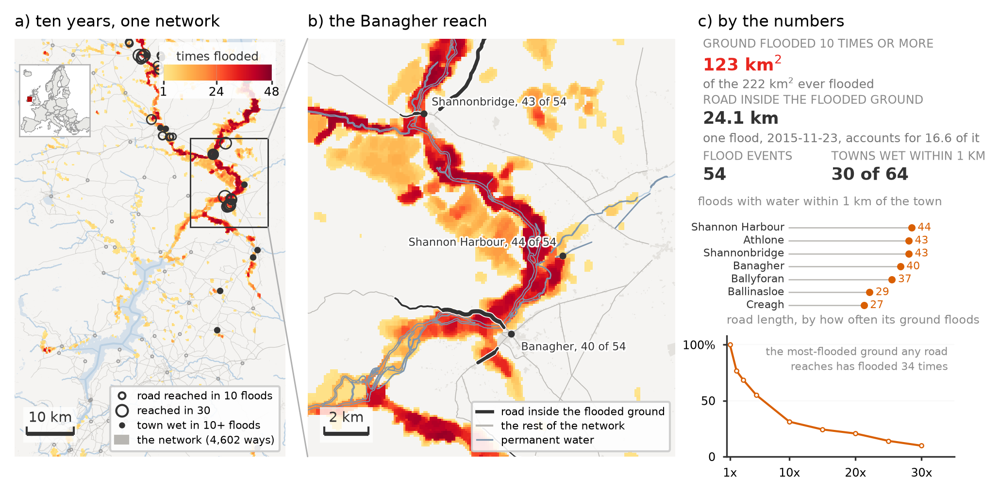

In [10]:
S.published_figure("shannon")

## Interpretation

The screen identifies where observed flooding *repeatedly reaches* the network, prioritising
segments and settlements for more detailed engineering and accessibility analysis. It does not,
on its own, establish any of the following:

1. **No routing or closure is implied.** A road within the flooded footprint is not necessarily
   impassable or severed, and no settlement is claimed isolated. This is exposure screening, not
   an accessibility model.
2. **The 1 km settlement rule is a heuristic**, chosen for screening, not a statement about which
   settlements were inundated.
3. **The footprint is a lower bound.** The approximately 90 m any-wet footprint enlarges the
   detected area relative to the native 20 m source, while radar under-detection omits water the
   sensor did not see; OpenStreetMap completeness also varies by area. Recurrence counts archived
   detections, never a return period.

## References and reuse

This notebook reproduces the Shannon callows case study (Supplementary Material, Section S1.3,
Fig. S3) of:

> J. Hackl (2026). *EuroFlood: a Python library and queryable index for the CEMS
> satellite-derived flood-depth archive of Europe.*